CS682 Project by Sourabh Kulkarni and Pradeep Ambati.

- Import clean image examples from imagenet
- Apply adversarial preturbations
- Pass through deep image prior based denoiser
- Compare adversarial and denoised images
- Use pretrained alexnet classifier to predict classes

Note: To see overfitting set `num_iter` to a large value.

# Import libs

In [1]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import numpy as np
from models import *

import torch
import torch.optim


from skimage.measure import compare_psnr
from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.

torch.cuda.get_device_name(0)


'GeForce GTX 970M'

In [8]:
# enter filename 
#fname = 'data/denoising/explaining-adversarial-gibbon.jpg'
fname = 'data/denoising/map2.jpg'


# Load image

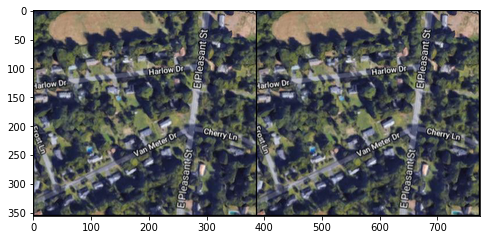

In [9]:
img_noisy_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_noisy_np = pil_to_np(img_noisy_pil)

# As we don't have ground truth
img_pil = img_noisy_pil
img_np = img_noisy_np
img_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_np = pil_to_np(img_pil)
    
#Add Extra Noise
#img_pil, img_np = get_noisy_image(img_np, sigma_)
if PLOT:
        plot_image_grid([img_np, img_noisy_np], 4, 6);

# Setup

In [14]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01 # default 0.01

OPTIMIZER='adam' # 'LBFGS', 'adam'
show_every = 100
exp_weight=0.99


num_iter = 1000
input_depth = 3
figsize = 5 

net = skip(
            input_depth, 3, 
            num_channels_down = [8, 16, 32, 64, 128], 
            num_channels_up   = [8, 16, 32, 64, 128],
            num_channels_skip = [0, 0, 0, 4, 4], 
            upsample_mode='bilinear',
            need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU')

net = net.type(dtype)


net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

Number of params: 572827


# Optimize

Starting optimization with ADAM


C:\Anaconda2\envs\CS682\lib\site-packages\torch\nn\modules\upsampling.py:122: UserWarning: nn.Upsampling is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.Upsampling is deprecated. Use nn.functional.interpolate instead.")
C:\Anaconda2\envs\CS682\lib\site-packages\torch\nn\functional.py:1961: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


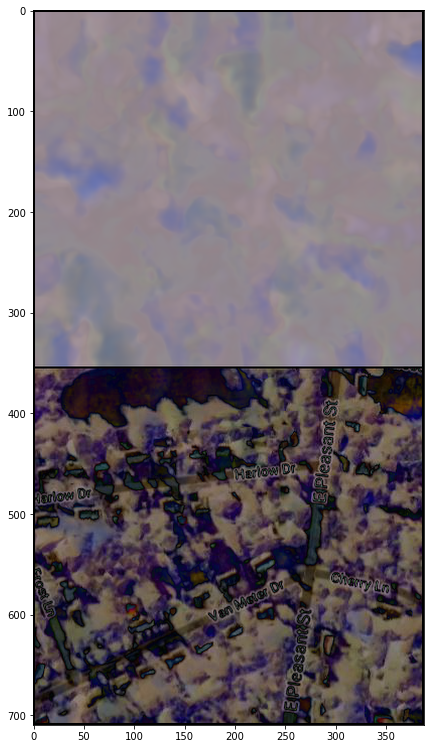

mean image 0.24641469


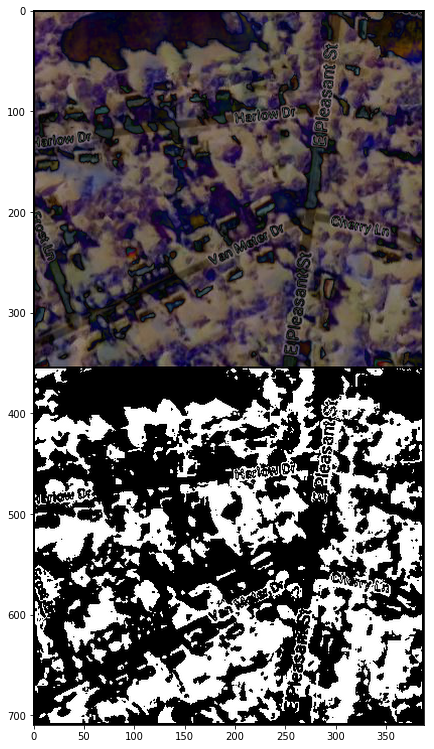

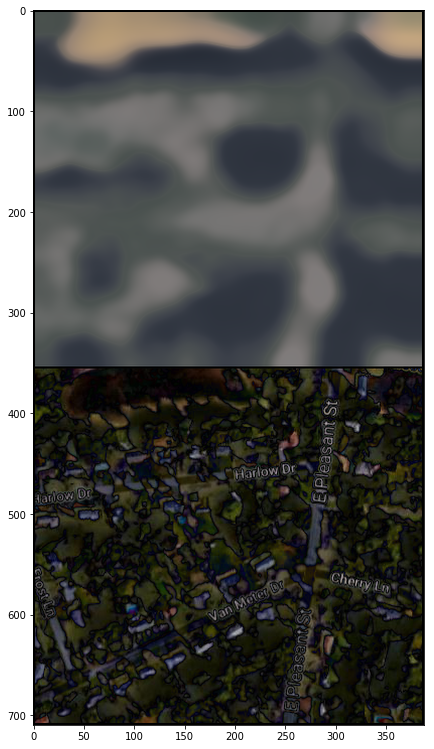

mean image 0.10373316


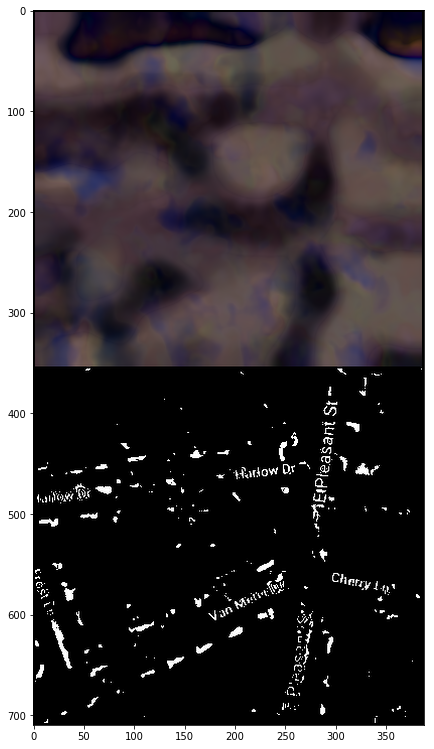

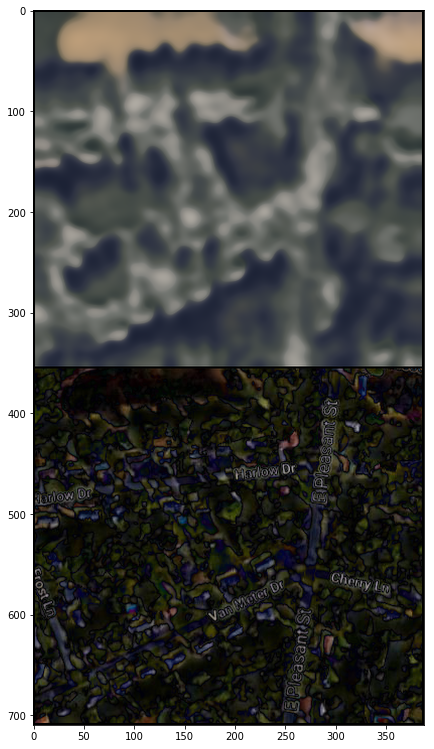

mean image 0.08628601


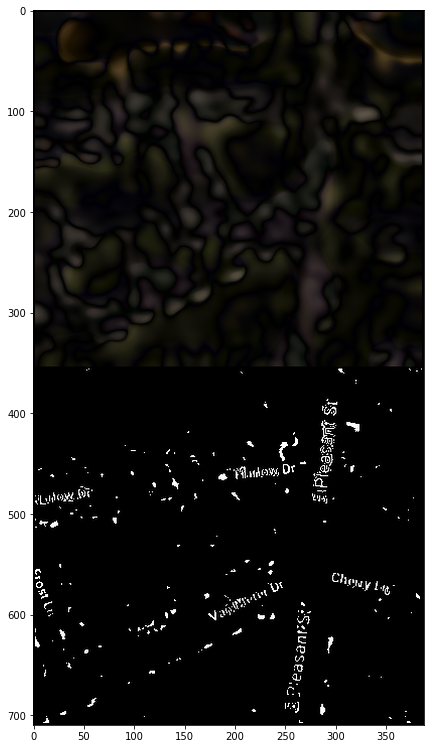

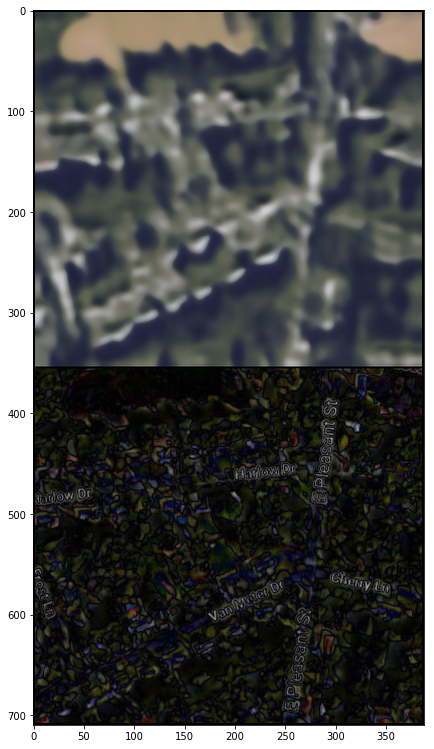

mean image 0.073318705


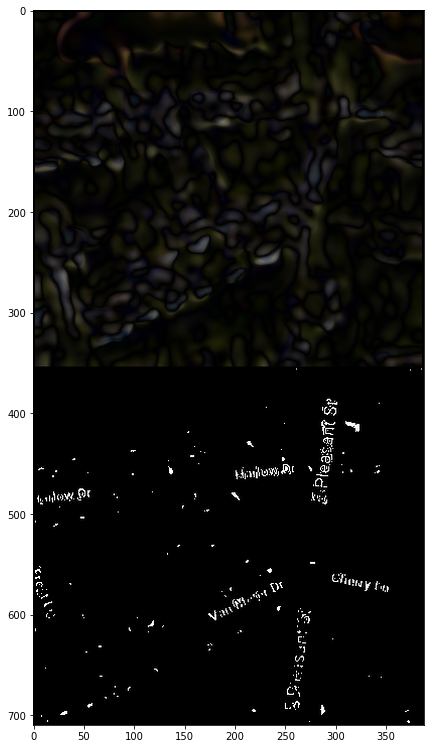

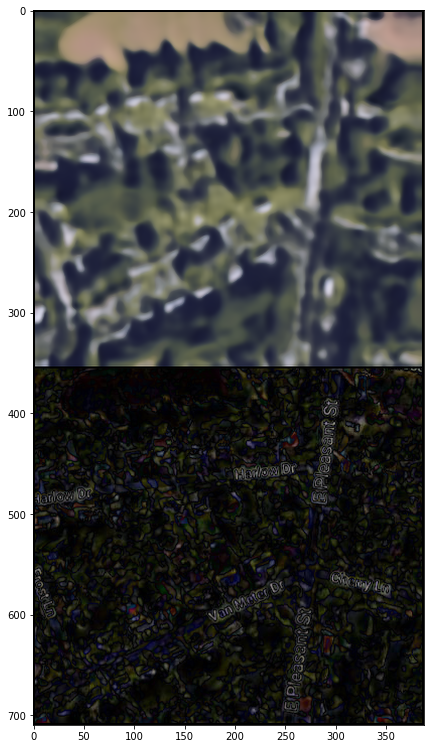

mean image 0.06317802


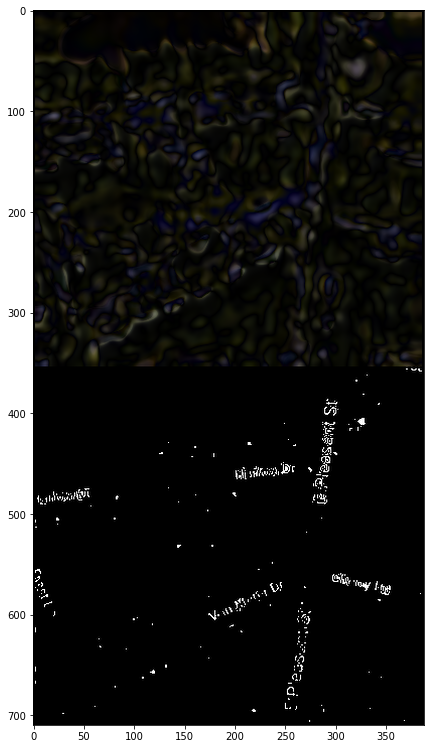

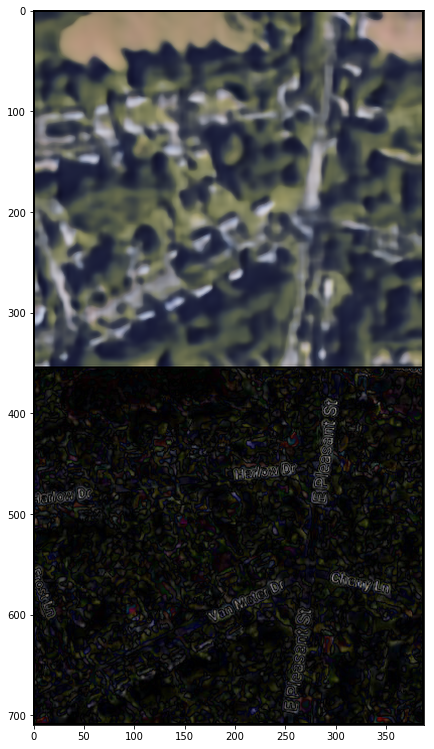

mean image 0.05388577


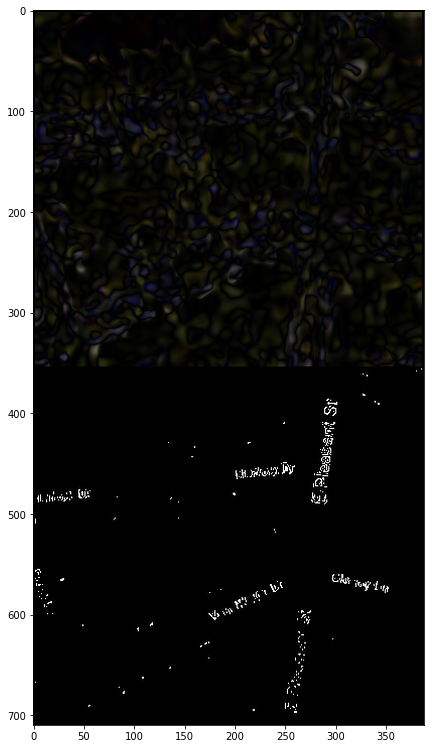

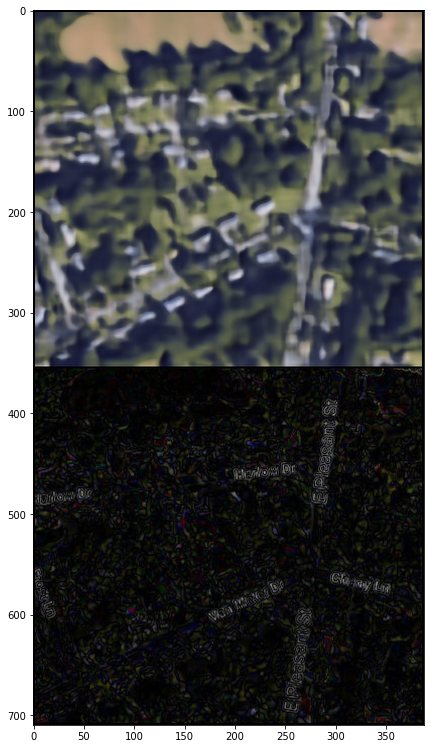

mean image 0.048928738


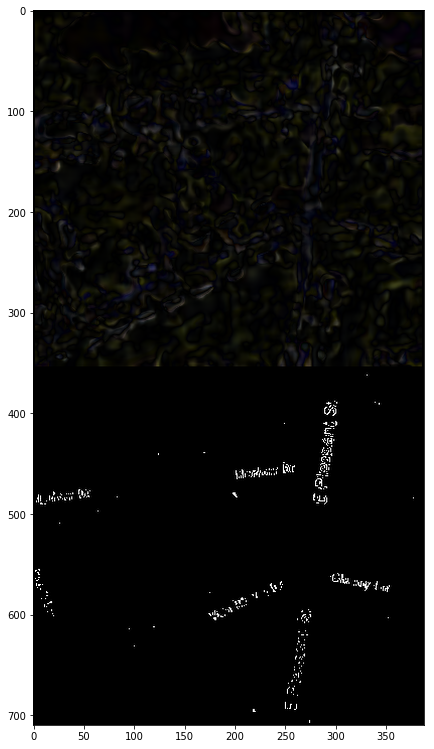

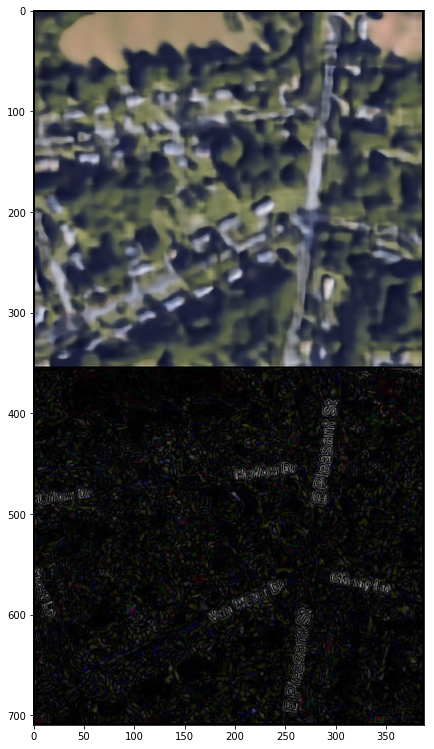

mean image 0.044256214


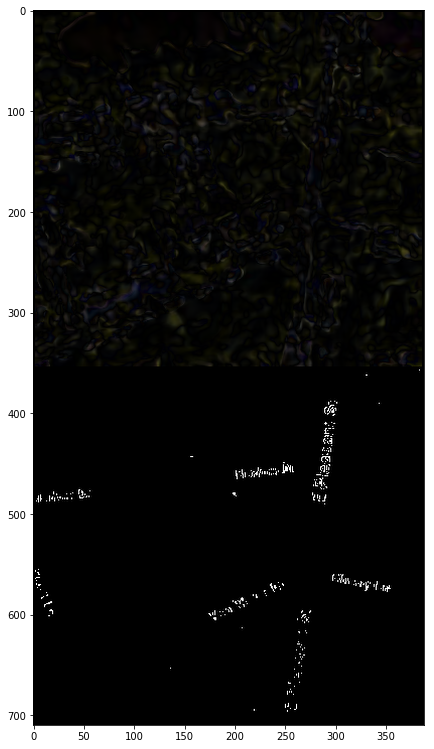

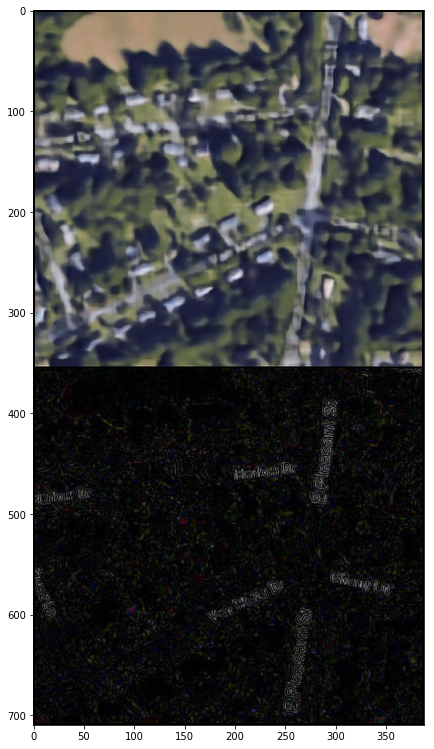

mean image 0.040485468


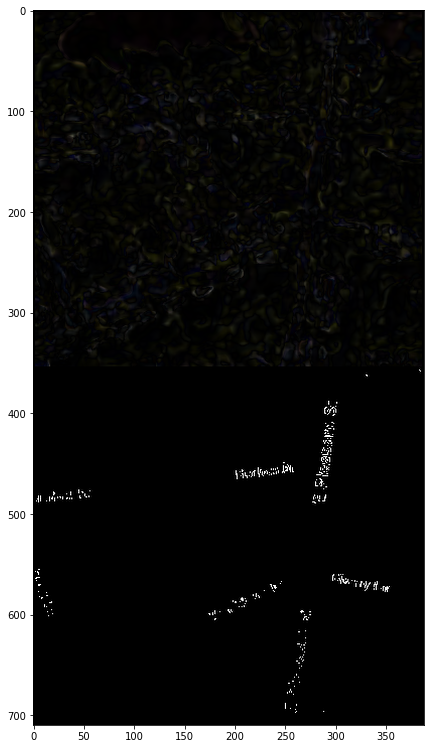

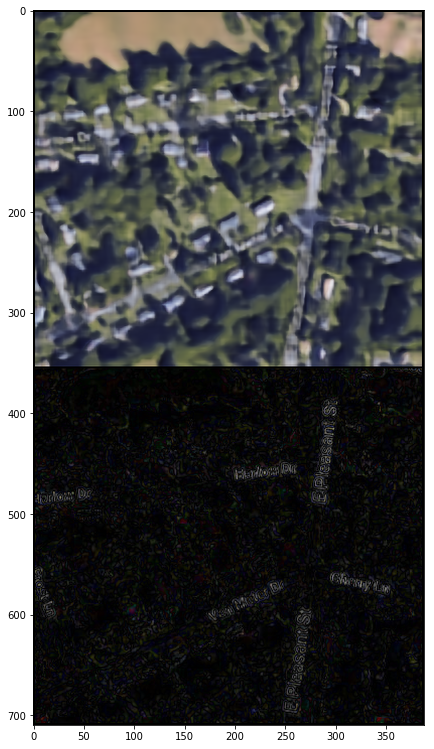

mean image 0.038693428


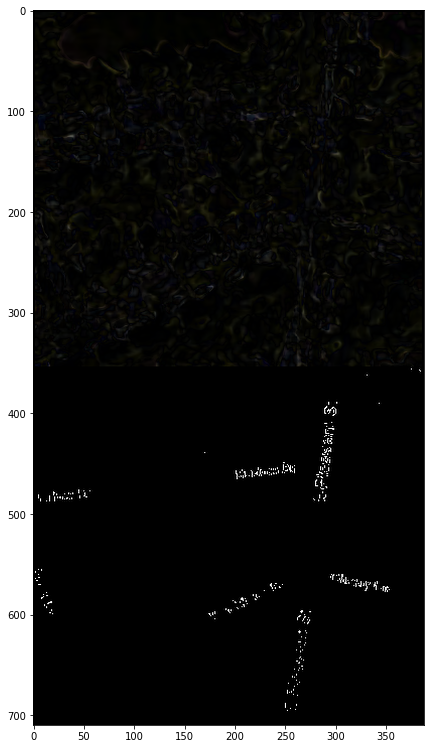

In [15]:

import torchvision.models as t_models
import requests
LABELS_URL = 'https://s3.amazonaws.com/outcome-blog/imagenet/labels.json'

response = requests.get(LABELS_URL) 
labels = {int(key): value for key, value in response.json().items()}


prev_out_np = img_np

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0

i = 0
def closure():
    
    global i, out_avg, psrn_noisy_last, last_net, net_input, prev_out_np
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)
    
    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
            
    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()
        
    
    psrn_noisy = compare_psnr(img_noisy_np, out.detach().cpu().numpy()[0]) 
    psrn_gt    = compare_psnr(img_np, out.detach().cpu().numpy()[0]) 
    psrn_gt_sm = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0]) 
    
    print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='')
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        diffimage = np.abs(img_np-out_np)
        plot_image_grid([np.clip(out_np, 0, 1), 
                         np.clip(diffimage, 0, 1)], factor=figsize, nrow=1)
        print ('mean image',np.mean(diffimage))
        mask = diffimage >= 0.25 # 0.08 hand_drawn, 0.2 plain_map, 0.25 green_map
        diffimage[:,:,:] = 0
        #mask = (diffimage[0] >= 190 and diffimage[1] >= 190 and diffimage[2] >= 190) 
        #mask2 = diffimage<150
        diffimage[mask] = 1
        diffimage[:] = np.sum(diffimage, axis=0)
        mask2 = diffimage == 3
        diffimage[:,:,:] = 0
        diffimage[mask2] = 255
        plot_image_grid([np.clip(np.abs(out_np-prev_out_np), 0, 1),np.clip(diffimage, 0, 1)], factor=figsize, nrow=1)
        prev_out_np = out_np 
    
    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5: 
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.detach().copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy
            
    i += 1

    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

C:\Anaconda2\envs\CS682\lib\site-packages\torch\nn\modules\upsampling.py:122: UserWarning: nn.Upsampling is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.Upsampling is deprecated. Use nn.functional.interpolate instead.")
C:\Anaconda2\envs\CS682\lib\site-packages\torch\nn\functional.py:1961: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


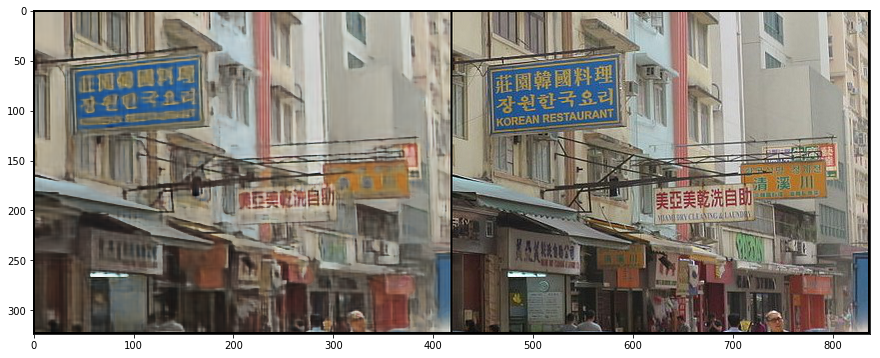

In [47]:
out_np = torch_to_np(net(net_input))
q = plot_image_grid([np.clip(out_np, 0, 1), img_np], factor=13);
